### Laboratorium 6 - część 2/2

W tej części zajmiesz się wykorzystaniem punktów kluczowych do dwóch popularnych zadań: wyszukiwania obszarów podobnych oraz łączenia obrazów (_image stitching_).

Przeczytaj treść całej instrukcji przed przystąpieniem do działania!

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#### Zadanie 3

Dane są obrazy `coke` i `table`. Wykorzystaj metodologię parowania punktów kluczowych do znalezienia wystąpienia puszki z Colą na stole. To zadanie jest podzielone na kilka kamieni milowych - czytaj dalej.

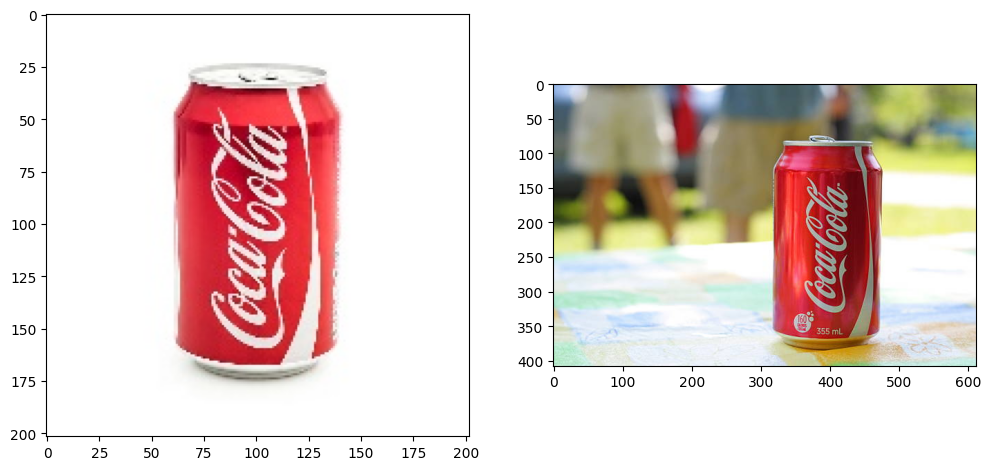

In [3]:
coke = cv2.imread('coke.jpg')
table = cv2.imread('coke-table.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(12,12))
a1.imshow(coke[..., ::-1]);
a2.imshow(table[..., ::-1]);

In [6]:
COKE = cv2.imread('coke.jpg')
TABLE = cv2.imread('coke-table.jpg')

##### Zadanie 3a

Wykonaj detekcję punktów kluczowych i ich parowanie z użyciem dowolnego matchera. Wykonaj filtrację znalezionych par po dystansie - co obserwujesz, zmieniając próg?

In [20]:
def plot_matching_distance(query_image: np.ndarray, train_image: np.ndarray, distance_thresholds: list[float]):
    sift: cv2.SIFT = cv2.SIFT_create()
    kps1, ds1 = sift.detectAndCompute(query_image, mask=None)
    kps2, ds2 = sift.detectAndCompute(train_image, mask=None)

    matcher: cv2.BFMatcher = cv2.BFMatcher_create()
    best_matches = np.array(matcher.match(ds1, ds2))
    distances = np.array([match.distance for match in best_matches])

    _, axes = plt.subplots(len(distance_thresholds), 1, figsize=(20, len(distance_thresholds) * 8))
    for ax, th in zip(axes, distance_thresholds):
        filtered_matches = best_matches[distances < th]
        img_matches = cv2.drawMatches(query_image, kps1, train_image, kps2, filtered_matches, None, matchColor=(255, 0, 255), singlePointColor=(255, 255, 0))
        ax.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
        ax.axis('off')
        ax.set_title(f'threshold: {th}')

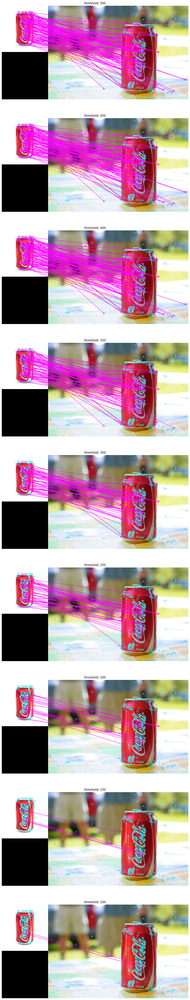

In [17]:
plot_matching_distance(COKE, table, [500, 450, 400, 350, 300, 250, 200, 150, 100])

##### Zadanie 3b

Powtórz detekcję z użyciem k-najlepszych wyników (dla niewielkiego k, np. 2 lub 3). Zaproponuj prosty sposób wykrywania sytuacji, w których jeden punkt jest podobnie bliski innym i użyj go do odfiltrowania wyników, tak aby pozostawić te bardziej unikatowe dopasowania. *Czy unikatowe znaczy dobre?*

In [51]:
def plot_matching_distance_knn(query_image: np.ndarray, train_image: np.ndarray, similarity_thresholds: list[float], k):
    sift: cv2.SIFT = cv2.SIFT_create()
    kps1, ds1 = sift.detectAndCompute(query_image, mask=None)
    kps2, ds2 = sift.detectAndCompute(train_image, mask=None)

    matcher: cv2.BFMatcher = cv2.BFMatcher_create()
    knn_matches = matcher.knnMatch(ds1, ds2, k=k)

    _, axes = plt.subplots(len(similarity_thresholds), 1, figsize=(20, len(similarity_thresholds) * 8))
    good_matches = []
    for ax, th in zip(axes, similarity_thresholds):
        for matches in knn_matches:
            for i, m in enumerate(matches):
                for n in matches[i+1:]:
                    if abs(m.distance - n.distance) < th:
                        good_matches.append(m)
        
        good_matches = sorted(good_matches, key=lambda x: x.distance)
        img_matches = cv2.drawMatches(query_image, kps1, train_image, kps2, good_matches, None, matchColor=(255, 0, 255), singlePointColor=(255, 255, 0))
        ax.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
        ax.axis('off')
        ax.set_title(f'threshold: {th}')

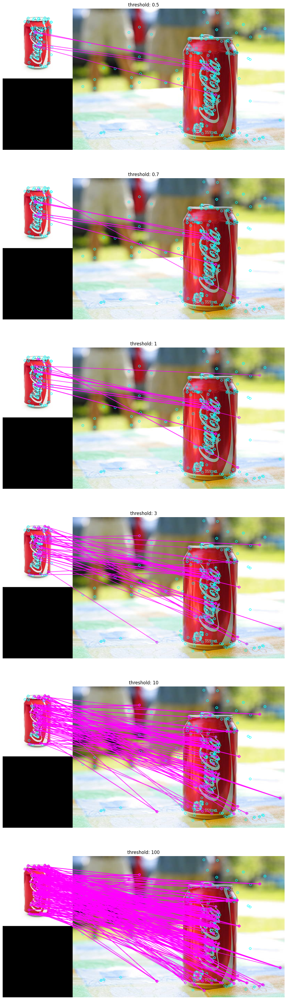

In [52]:
plot_matching_distance_knn(COKE, TABLE, [0.5, 0.7, 1, 3, 10, 100], 3)

##### Zadanie 3c

Znajdź transformację geometryczną dla par dopasowanych punktów, tak aby przekształcić `coke` (*train*) do geometrii `table` (query). Zademonstruj poprawność, zestawiając obok siebie przekształconą wersję `coke` oraz oryginalny `table`, bądź nanosząc jedno na drugie. Zidentyfikuj punkty, które znaleziona transformacja przekształca "dobrze", tzn. ich współrzędne po przekształceniu leżą w pobliżu odpowiadających im punktów z drugiego obrazu; nanieś je na obraz.

*Jak na wyniki wpływa wykrycie większej lub mniejszej liczby punktów kluczowych na etapie SIFT? W jakim stopniu wstępna filtracja poprawia rezultaty? Jak działa i jaką rolę w procesie parowania odgrywa RANSAC?*

In [ ]:
def plot_warping(query: np.ndarray, train: np.ndarray, distance_thresholds: list[float]):
    sift: cv2.SIFT = cv2.SIFT_create()
    kps1, ds1 = sift.detectAndCompute(query, mask=None)
    kps2, ds2 = sift.detectAndCompute(train, mask=None)

    matcher: cv2.BFMatcher = cv2.BFMatcher_create()
    best_matches = np.array(matcher.match(ds1, ds2))
    distances = np.array([match.distance for match in best_matches])
    kps1_xy = np.array([kps1[match.queryIdx].pt for match in best_matches]) 
    kps2_xy = np.array([kps2[match.trainIdx].pt for match in best_matches])

    _, axes = plt.subplots(len(distance_thresholds), 1, figsize=(20, len(distance_thresholds) * 8))

    for ax, th in zip(axes, distance_thresholds):
        filtered_matches = best_matches[distances < th]
        filtered_kps1_xy = kps1_xy[distances < th]
        filtered_kps2_xy = kps2_xy[distances < th]

        w, h, _ = train.shape
        homography, _ = cv2.findHomography(filtered_kps1_xy, filtered_kps2_xy, cv2.RANSAC, 0.5)

        # warp the query image
        warped_query = cv2.warpPerspective(query, homography, dsize=(w, h))

        # warp the keypoints
        points = np.column_stack([filtered_kps1_xy, np.ones(len(filtered_kps1_xy)).reshape(-1, 1)])
        warped_points = (homography.dot(points.T).T)[:, :2]

        # draw
        matched_blend = cv2.addWeighted(cv2.cvtColor(train, cv2.COLOR_BGR2RGB), 0.5, cv2.cvtColor(warped_query, cv2.COLOR_BGR2RGB), 0.5, 0)
        well_matched_blend = cv2.addWeighted(cv2.cvtColor(train, cv2.COLOR_BGR2RGB), 0.5, cv2.cvtColor(warped_query, cv2.COLOR_BGR2RGB), 0.5, 0)

        well_matched = []
        for p1, p2 in zip(filtered_kps2_xy, warped_points):
            p1 = p1.astype(np.int32)
            p2 = p2.astype(np.int32)

            cv2.circle(well_matched, p1, radius=4, color=(255, 156, 126), thickness=-1)
            cv2.circle(well_matched, p2, radius=4, color=(255, 156, 126), thickness=-1)

#### Zadanie 4

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy (1) zawierały jakieś punkty charakterystyczne oraz (2) spełniały założenia transformacji perspektywicznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o połowę-2/3 szerokości klatki),
* większe przesunięcie (o 3/4-4/5 szerokości),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Celem zadania będzie przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia (_stitching_) obrazów. Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3c) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary tworzonych w ten sposób obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jaka jest jakość dopasowania? Jeśli dla którejś pary algorytm zawiódł - dlaczego?*